# Bootstrapping Acoustic-Trawl Uncertainty Estimates

This notebook outlines how a variety of bootstrapping procedures, both parametric and non-parametric, can be put together to estimate the total uncertainty in an acoustic-trawl survey. It follows the basic steps used in our usual MACE survey analysis, which makes it easy to interpret in relation to our standard outputs. It also runs quickly, and unlike more advanced state-space models, does not need to maximize anything globally or converge to a posterior. Its disadvantage compared to those models is that it estimates the distribution of the otputs of a deterministic processing pipeline, which eliminates a few of the degrees of freedom a state-space model would have, and means the distributions of the results are a step removed from the underlying biology we're really trying to estimate.

Loading in data from the 2018 EBS survey and plotting the NASC and trawl locations:

In [1]:
using CSV, DataFrames, DataFramesMeta
using GeoStats, GeoStatsPlots
using Distances
using NearestNeighbors
using Statistics, StatsBase
using Distributions
using Random
using LinearAlgebra
using StatsPlots, StatsPlots.PlotMeasures

surveydir = joinpath(@__DIR__, "surveydata", "201807")

acoustics = CSV.read(joinpath(surveydir, "acoustics_projected.csv"), DataFrame)
trawl_locations = CSV.read(joinpath(surveydir, "trawl_locations_projected.csv"), DataFrame)
scaling = CSV.read(joinpath(surveydir, "scaling.csv"), DataFrame);
first(acoustics, 5)

Row,transect,interval,lat,lon,class,nasc,x,y
,Int64,Int64,Float64,Float64,String15,Float64,Float64,Float64
1,1,20180608055320,57.1736,-160.915,PK1,0.335756,746.887,6344.11
2,1,20180608055623,57.1653,-160.918,PK1,48.4623,746.781,6343.18
3,1,20180608055846,57.157,-160.919,PK1,50.1816,746.769,6342.26
4,1,20180608060108,57.1487,-160.92,PK1,14.8782,746.772,6341.33
5,1,20180608060331,57.1404,-160.92,PK1,2.58299,746.804,6340.4


Before starting the analysis, we choose a spatial resolution--in this case, 10 km.    

994

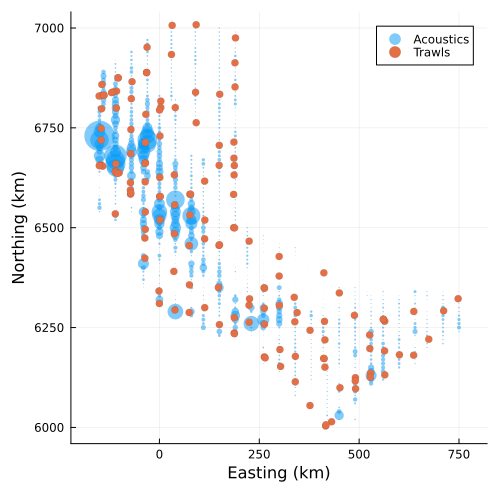

In [84]:
acoustics = @chain acoustics begin
    DataFramesMeta.@transform(:x = round.(:x, digits=-1), :y = round.(:y, digits=-1))
    @by([:transect, :x, :y], :nasc = mean(:nasc))
end
println(nrow(acoustics))
scatter(acoustics[:,:x], acoustics[:,:y], markerstrokewidth=0, aspect_ratio=:equal,
    markersize=acoustics[:, :nasc]*1e-2, alpha=0.5, label="Acoustics",
    xlabel="Easting (km)", ylabel="Northing (km)")
scatter!(trawl_locations[:, :x], trawl_locations[:, :y], markerstrokewidth=0, 
    aspect_ratio=:equal, label="Trawls", size=(500, 500))

One of our fundamental challenges is that we need to infer the density of fish across a continous large marine ecosystem (e.g. the EBS), but can only sample that ecosystem along discrete line transects separated by 10s of km, with a few point trawls along each transect. We work around this extremely sparse sampling by assuming that what we see along the transects--both the mean density of fish, and their spatial pattern--tells us about the range of possible densities that could exist between them. 

Traditional geostatistical techniques like variography, Gaussian processes, and conditional simulation offer a standard way to do this, *if* we can assume our spatial variables are normally distributed. Conventional geostatistics (variography, Kriging, conditional simulation etc.) don't explicitly require normality, but they provide means and covariance matrices for the spatial variables, which make it easy to interpret them as drawn from multivariate normal distributions (which are parameterized by a mean vector $\mu$ and a square covariance matrix $Q$)

For non-Gaussian variables like acoustic backscatter, however, these techniques will not work out of the box. One workaround is to transform the raw variable (NASC, in our case) to make it approximately normal, then do Gaussian modeling and simulation on the transformed variable. However, this approach can get complicated quickly, since transforming the data also changes its variogram, and when transformed back onto its original scale, the spatial autocorrelation may not be correct. This "Gaussian anamorphosis" and associated problems formed a major part of Woillez et al.'s (2016) uncertainty analysis.

However, there is another way to do contitional geostatistical simulations which does not require Gaussian anamorphosis. It requires only the mean and covariance matrix, which are easy to derive given a set of observed data and a variogram model. If we know the mean and covariance of a variable, we can generate appropriately correlated random draws from that variable using the well-known "Cholesky trick." The Cholesky decomposition factorizes a (positive-definite) matrix into two triangular matrices as $Q = L L^T$. If $\mathbf{z}$ is a vector of *uncorrelated* random variables with variance 1, it can be transformed into a *correlated* random vector $\mathbf{x}$ by multiplying it with $L$:
$$
\mathbf{x} = L \mathbf{z}.
$$

To see why, we go back to the definitions of the mean and covariance,

$$
\mu = \mathbb{E}(\mathbf{x})\\
Q = \mathrm{cov}(\mathbf{x}) = \mathbb{E}(\mathbf{x}\mathbf{x}^T).
$$

If $\mathbf{z}$ is a vector of uncorrelated random variables with variance 1, then $\mathrm{cov}(\mathbf{z}) = \mathbb{E}(\mathbf{z} \mathbf{z}^T) = I$, where $I$ is the identity matrix (because the elements of $\mathbf{z}$ are all uncorrelated with each other, all off-diagonal elements of its covariance matrix are zero). Using that fact, and a few linear algebra identities, we can rearrange the definition of the Cholesky factorization as follows,

$$
Q = L L^T = L I L^T =
L \mathbb{E}(\mathbf{z} \mathbf{z}^T) L^T = \mathbb{E}(L \mathbf{z} \mathbf{z}^T L^T) = 
\mathbb{E}((L \mathbf{z}) (\mathbf{z}^T L^T)) =
\mathbb{E}((L \mathbf{z}) (L \mathbf{z})^T),
$$

which, from the definition of covariance, implies that 

$$
\mathrm{cov}(L \mathbf{z}) = Q.
$$

This means that the random vector $\mathbf{x}$ generated by multiplying $L$ with the  white-noise random vector $\mathbf{z}$ will be correlated according to the covariance matrix $Q$. Snce a variogram fitted to data gives us the theoretical correlation between any two spatial points, this allows us to calculate $Q$ and $L$, and to generate random fields with that spatial structure. Critically, $\mathbf{z}$ doesn't have to be normal. We can draw it from any distribution we want, including non-negative ones.

However, one more condition must be met as well: we want the simulated field to have the correct mean value at every point, interpolated between observations. This is easy if it is Gaussian, because the mean can be subtracted off, then added back after simulating a mean-zero correlated spatial field. With a non-negative field, this won't work. Instead, we need to set the mean of each element of $\mathbf{z}$ such that $\mathbf{x}$ has the desired expected value $\mathbf{\mu}_x$. If we have $L$, this is also easy to do.

$$
\mathbf{\mu}_x = \mathbb{E}(L \mathbf{z}) = L \mathbb{E}(\mathbf{z}) \\
L^{-1} \mathbf{\mu}_x = \mathbb{E}(\mathbf{z}) \equiv \mathbf{\mu}_z
$$

Our first step is to estimate the empirical variogram and fit a model to it. This model will then allow us to calculate $Q$ and $L$.

┌ Warning: duplicate coordinates found
└ @ Variography C:\Users\sam.urmy\.julia\packages\Variography\RbrBT\src\empirical.jl:267


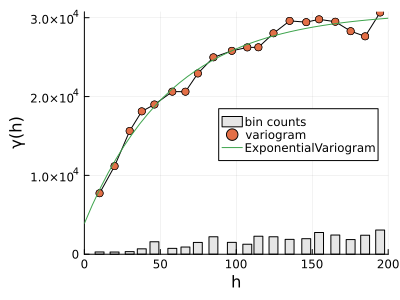

In [12]:
geonasc = acoustics[!, [:nasc, :x, :y]]
geonasc.nasc .+= 1e-3
geonasc = georef(geonasc, (:x, :y))
maxlag = 200
evg = EmpiricalVariogram(geonasc, :nasc, maxlag=maxlag)
p1 = plot(evg,  size=(400, 300))
tvg = fit(ExponentialVariogram, evg)
plot!(p1, tvg, xlims=(0, maxlag), legend=:right)

Next we have to define a spatial domain to do the simulation on. I find the convex hull of all the transects and define a 10 km x 10 km grid inside that polygon.

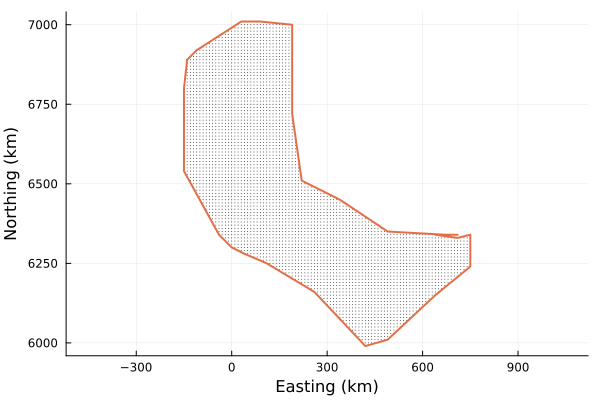

In [79]:
using ConcaveHull
transect_ends = @chain acoustics begin
    @orderby(:y)
    @by(:transect, 
        :x = [first(:x) + 10, first(:x) - 10, last(:x) + 10, last(:x) - 10],
        :y = [first(:y), first(:y), last(:y), last(:y)])
end

v = [[row.x, row.y] for row in eachrow(acoustics)]
surveyhull = concave_hull(v, 172)
dx = 10.0
dy = 10.0
xgrid = range(round.(extrema(transect_ends.x))..., step=dx)
ygrid = range(round.(extrema(transect_ends.y))..., step=dy)
surveydomain = PointSet(hcat([[x, y] for x in xgrid, y in ygrid
    if in_hull([x, y], surveyhull)]...))
plot(surveydomain, markersize=0.5, xlabel="Easting (km)", ylabel="Northing (km)", aspect=:equal)
plot!(surveyhull)

Setting up the geostatistical simulation problem, defining the matrix $L$ based on the variogram:

In [73]:
prob = SimulationProblem(geonasc, surveydomain, :nasc => Float64, 1)
solver = LUGS(:nasc => (variogram = tvg,))
sol = solve(prob, solver) # only doing this to get simulation domain: could eliminate?
preproc = preprocess(prob, solver);

Unlike the normal distribution, non-negative distributions are usually not parameterized explicitly in terms of their mean and variance. For instance, the gamma distribution can have a "shape" parameter $k$ and "scale" parameter $\theta$. However, since these determine its mean and variance as $\mu = k \theta$ and $\sigma^2 = k \theta^2$, it's easy to solve for them given a desired $\mu$ and $\sigma^2$.

Here, we get $L$ and the interpolated mean $\mu_x$ out of the pre-processed parameter structure from the cell above. We force $\mu_x$ to have the same mean as the observed NASC, make sure it's all non-negative, and then solve the equation
$$
\mu_z = L^{-1} \mu_x
$$
to get the white-noise means. The white-noise variances are all set to 1.

In [74]:
params = preproc[(:nasc,)][1]
data, μx, L, μ, dlocs, slocs = params
npts = length(dlocs) + length(slocs)
μx = copy(μx)
μx[μx .< 0] .= 1e-2
μx = μx .* mean(acoustics.nasc) ./ mean(μx)

μz = L \ μx
μz[μz .<= 0] .= 1e-6

vz = ones(length(μz))

# xx = first.(coordinates.(domain(sol))[slocs])
# yy = last.(coordinates.(domain(sol))[slocs]);
# scatter(xx, yy, zcolor=sqrt.(vz), markerstrokewidth=0, markersize=1.5, marker=:square)
dim(L)

8586

Next, we define a couple of helper functions and do the actual simulation. I'm using an inverse Gaussian distribution for the white noise, but there are others that I could try as well to see which gives the most realistic output.

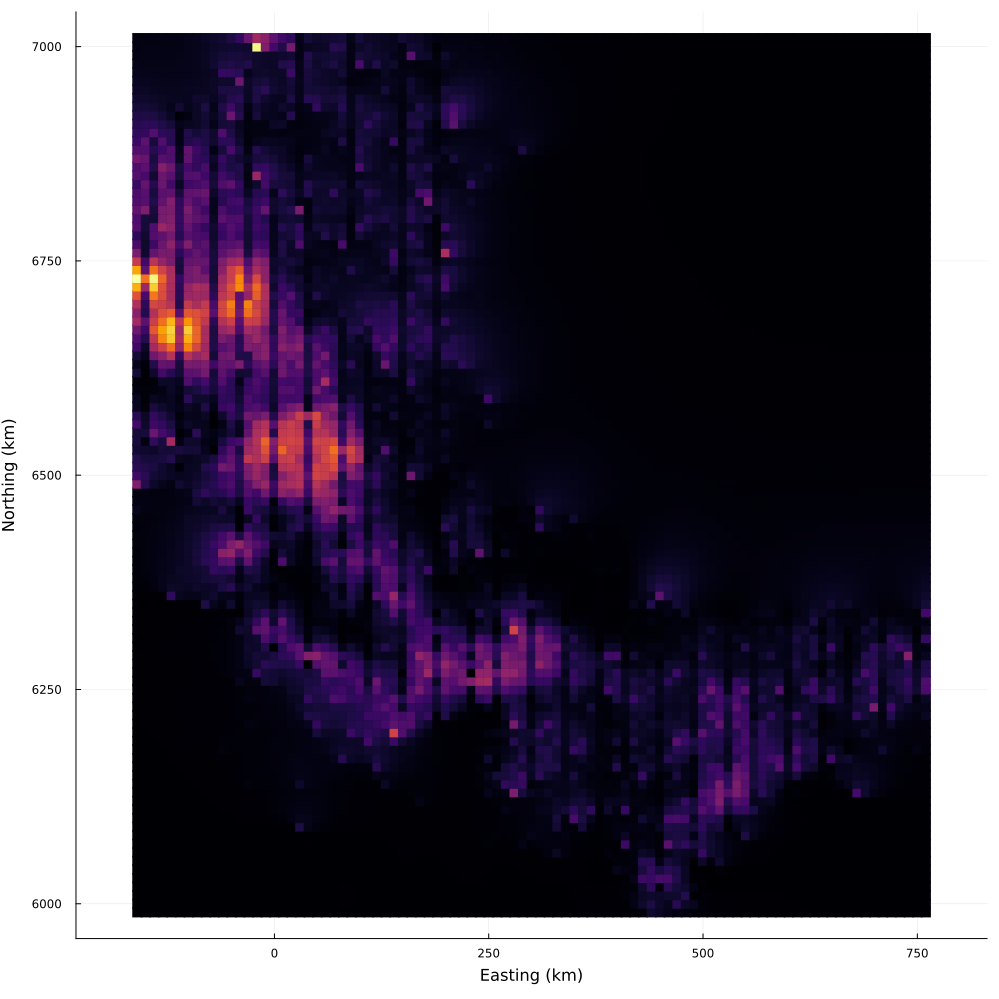

In [78]:
dist_params(d::Type{Gamma}, μ, v) = (v / μ, μ^2 / v)
dist_params(d::Type{InverseGaussian}, μ, v) = (μ, μ^3 / v)
dist_params(d::Type{InverseGamma}, μ, v) = (μ^2 / v + 2, μ^3/v + μ)
dist_params(d::Type{LogNormal}, μ, v) = ( log(μ) - log(v/exp(2log(μ)) + 1) / 2, sqrt(log(v/exp(2log(μ)) + 1)) )

function nonneg_lusim!(x, params, zdists)
    data, μx, L, μ, dlocs, slocs = params
    x[slocs] = L * rand.(zdists)
    x[dlocs] = data
end
function nonneg_lusim(params, zdists)
    data, μx, L, μ, dlocs, slocs = params
    npts = length(dlocs) + length(slocs)
    x = zeros(npts)
    nonneg_lusim!(x, params, zdists)
    return x
end

Dist = InverseGaussian
zdists = [Dist(p...) for p in dist_params.(Dist, μz, vz)]
x = nonneg_lusim(params, zdists)

plot(domain(sol), zcolor=x, clims=(0, 2000),
    markerstrokewidth=0, markershape=:square,
    markersize=5, xlabel="Easting (km)", ylabel="Northing (km)")
scatter!(acoustics[:, :x], acoustics[:, :y], color=:white, markersize=acoustics[:, :nasc]*7e-3, alpha=0.3,
    markerstrokewidth=0, size=(800, 800))

Comparing this map of simulated NASC to the over-plotted bubbles, we can see that it does a decent job of interpolating the acoustic density between transects, while also allowing that density to fluctuate randomly.

As a contrast, the current approach is to assume that each acoustic interval is representative of a rectangle extending halfway to the next transect on either side. The map of that assumption looks like this:

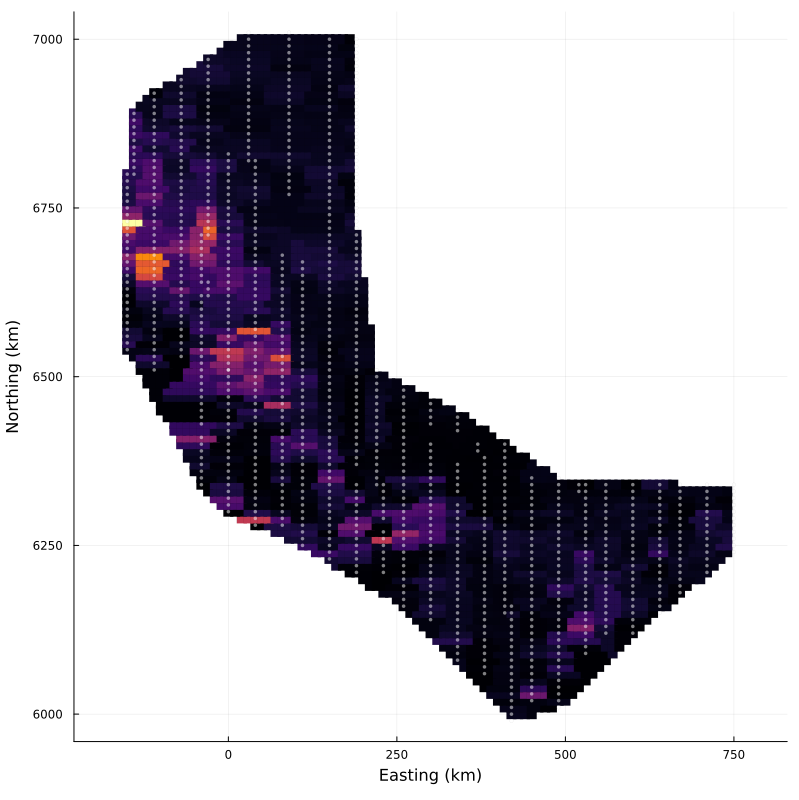

In [29]:
edsu_tree = BallTree([acoustics.x'; acoustics.y'], Cityblock())
edsu_idx, edsu_dists = nn(edsu_tree, coordinates.(surveydomain))
plot(domain(sol), zcolor=acoustics.nasc[edsu_idx],# clims=(0, 2000), 
    markerstrokewidth=0, markershape=:square,
    markersize=5, xlabel="Easting (km)", ylabel="Northing (km)", size=(800, 800))
scatter!(acoustics.x, acoustics.y, color=:white, markersize=2, markerstrokewidth=0, alpha=0.5)

I simulate 100 of these fields, and look at the distribution of their means, standard deviations, and 10th and 90th percentiles compared to the same statistics for the observed NASC (orange lines). The simulated fields look decently realistic:

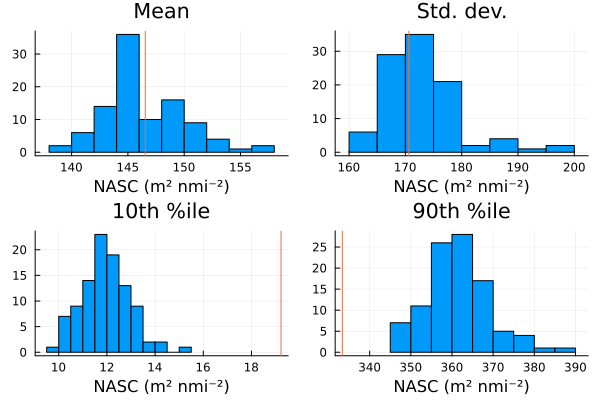

In [31]:
nasc_sim = [nonneg_lusim(params, zdists) for _ in 1:100];
pm = histogram(mean.(nasc_sim)); vline!(pm, [mean(acoustics.nasc)], title="Mean");
pv = histogram(std.(nasc_sim)); vline!(pv, [std(acoustics.nasc)], title="Std. dev.");
p01 = histogram(quantile.(nasc_sim, 0.1)); vline!(p01, [quantile(acoustics.nasc, 0.1)],
    title="10th %ile");
p90 = histogram(quantile.(nasc_sim, 0.9)); vline!(p90, [quantile(acoustics.nasc, 0.90)],
    title="90th %ile");
plot(pm, pv, p01, p90, legend=false, xlabel="NASC (m² nmi⁻²)")

In [32]:
bin_edges = 0:10:5000
h_nasc = normalize(fit(StatsBase.Histogram, acoustics.nasc, bin_edges), mode=:density)

dists = [Gamma, InverseGamma, InverseGaussian, LogNormal]
dist_fits = map(collect(Iterators.product(dists, 1:500))) do (Dist, i)
    zdists = [Dist(p...) for p in dist_params.(Dist, μz, vz)]
    x = nonneg_lusim(params, zdists)
    h_sim = normalize(fit(StatsBase.Histogram, x, bin_edges), mode=:density)
    kld = evaluate(KLDivergence(), h_nasc.weights, h_sim.weights)
    return (distribution = string(Dist), kld = kld)
end |> vec |> DataFrame
@chain dist_fits begin
    @subset(isfinite.(:kld))
    @by(:distribution, 
        :mean_kld = mean(:kld), 
        :se_kld = std(:kld) / sqrt(length(:kld)))
end


Row,distribution,mean_kld,se_kld
,String,Float64,Float64
1,Gamma,-128.464,0.0221903
2,InverseGamma,-130.252,0.0192139
3,InverseGaussian,-126.8,0.0317586
4,LogNormal,-129.085,0.0231745


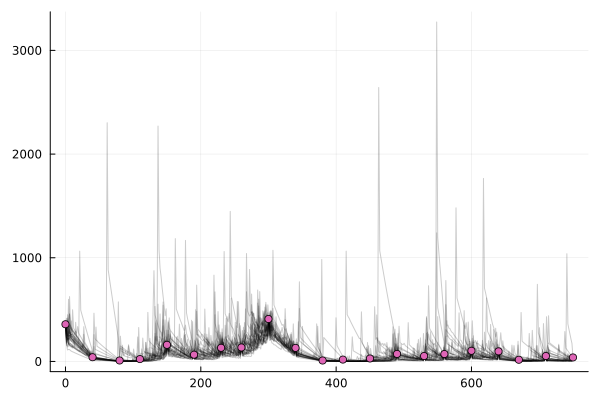

In [33]:
y_slice = 6300
acoustics_slice = @chain acoustics begin
    @subset(y_slice .< :y .<= y_slice + dy)
    DataFramesMeta.@transform(:x = round.(:x))
    @by(:x, :nasc = mean(:nasc))
    DataFramesMeta.@transform(:y = y_slice)
end
xx_slice = range(minimum(acoustics_slice.x), maximum(acoustics_slice.x), length=500)
yy_slice = fill(y_slice, length(xx_slice))
geonasc_slice = georef(acoustics_slice, (:x, :y))
slice_domain = PointSet(hcat([[x, y] for (x, y) in zip(xx_slice, yy_slice)]...))
prob_slice = SimulationProblem(geonasc_slice, slice_domain, :nasc => Float64, 1)
preproc_slice = preprocess(prob_slice, solver)
params_slice = preproc_slice[(:nasc,)][1]
μx_slice = params_slice[2]
L_slice = params_slice[3]
μz_slice = L_slice \ μx_slice
vz_slice = ones(length(μz_slice))
zdists_slice = [Dist(p...) for p in dist_params.(Dist, μz_slice, vz_slice)]

p_slice = plot(legend=false)
for i in 1:30
    nasc_slice = nonneg_lusim(params_slice, zdists_slice)
    plot!(p_slice, xx_slice, nasc_slice, color=:black, alpha=0.2, label="")
end
@df acoustics_slice scatter!(p_slice, :x, :nasc)
# plot!(p_slice, xx_slice, μx_slice)

Next, we need to load in the trawl data, georeference it, and calculate some trawl-by-trawl summaries, like the average backscattering cross-section, length, and weight.  We also fit variogram models to these averaged quantities, which allow us to simulate autocorrelated values for them across the same simulation pixels we did for NASC.

In [34]:
predict_ts(L) = -66 * 20log10(L)
predict_ts_stochastic(L) = -66 * 20log10(L) .+ 0.14randn()
predict_weight(L) = 1e-5 * L^2.9

# Numbers from Matta and Kimura 2012, Age determination manual
const L∞ = 67.33 # mm
const t₀ = -0.205
const K = 0.1937
const AGE_MAX = 10
predict_length(t) = L∞ * (1 - exp(-K * (t - t₀)))
function predict_age(L, age_max=AGE_MAX)
    if L < predict_length(age_max)
        return round(Int, log(1 - L/L∞) / -K + t₀)
    else
       return age_max
   end
end

scaling = @chain scaling begin 
    @subset(:class .== "PK1", :analysis_id .== 7, :species_code .== 21740)
    DataFramesMeta.@transform(:weight = predict_weight.(:primary_length))
end

trawl_means = @chain scaling begin
    @by(:event_id, :sigma_bs = mean(:sigma_bs, Weights(:w)),
                   :sigma_bs_std = std(:sigma_bs, Weights(:w)),
                   :length = mean(:primary_length, Weights(:w)),
                   :weight = mean(:weight, Weights(:w)))
    DataFramesMeta.@transform(:ts = 10log10.(:sigma_bs))
    leftjoin(trawl_locations, on=:event_id)
end

geotrawl_means = @chain trawl_means begin
    @select(:x, :y, :ts, :length, :weight) 
    DataFramesMeta.@transform(:ts_centered = :ts .- mean(:ts),
               :weight_centered = :weight .- mean(:weight),
               :length_centered = :length .= mean(:length))
    georef((:x, :y))
end

all_ages = @chain Iterators.product(unique(scaling.event_id), 1:AGE_MAX) begin
    DataFrame()
    rename([:event_id, :age])
    sort()
end

age_comp = @chain scaling begin
    DataFramesMeta.@transform(:age = predict_age.(:primary_length))
    @by([:event_id, :age], :p_age=sum(:w))
    DataFrames.groupby(:event_id)
    DataFramesMeta.@transform(:p_age = :p_age / sum(:p_age))
    rightjoin(all_ages, on=[:event_id, :age])
    DataFramesMeta.@transform(:p_age = replace(:p_age, missing => 0.0))
end

trawl_vars = (:ts_centered, :weight_centered)    
trawl_vgs = Dict((sym => EmpiricalVariogram(geotrawl_means, sym) for sym in trawl_vars)...,)
trawl_tvgs = Dict((sym => fit(SphericalVariogram, trawl_vgs[sym]) for sym in trawl_vars)...,)
trawl_probs = Dict((sym => SimulationProblem(geotrawl_means, surveydomain, sym => Float64, 1) 
    for sym in trawl_vars)...,)
trawl_sols = Dict((sym => solve(trawl_probs[sym], LUGS(sym => (variogram=trawl_tvgs[sym],)))
    for sym in trawl_vars)...,)


Dict{Symbol, Ensemble{PointSet{2, Float64}}} with 2 entries:
  :weight_centered => 2D Ensemble
  :ts_centered     => 2D Ensemble

In [35]:
ts_sim = DataFrame(trawl_sols[:ts_centered][1]).ts_centered .+ mean(trawl_means.ts)
weight_sim = DataFrame(trawl_sols[:weight_centered][1]).weight_centered .+ mean(trawl_means.weight)
sigma_bs_sim = [exp10.(ts / 10) for ts in ts_sim]
dA = dx * dy / 1.852^2 # nasc is in m^2/nmi, but dx and dy are in km. 
N_sim = x ./ (4π * sigma_bs_sim);

So at every simulated point, we now have a NASC value and a $\langle \sigma_{bs} \rangle$ value, which is enough to get us an estimate of total numerical density. We next need to figure out how to allocate that density to age classes based on the proportions in the trawl.

I take a simple approach of resampling the the measured fish from the trawl, i.e. from the "scaling key source data" table in Macebase, and then calculating proportions-at-age from those bootstrapped tables. The cell below defines a few helper functions to do that.

In [36]:
function resample_df(df)
    n = nrow(df)
    ii = sample(1:n, n)
    return @view df[ii, :]
end

function resample_scaling(df)
    return DataFramesMeta.combine(resample_df, DataFramesMeta.groupby(df, :event_id))
end

function proportion_at_age(scaling)
    age_comp = @chain scaling begin
        DataFramesMeta.@transform(:age = predict_age.(:primary_length))
        @by([:event_id, :age], :p_age=sum(:w))
        DataFrames.groupby(:event_id)
        DataFramesMeta.@transform(:p_age = :p_age / sum(:p_age))
        rightjoin(all_ages, on=[:event_id, :age])
        DataFramesMeta.@transform(:p_age = replace(:p_age, missing => 0.0))
        DataFramesMeta.@transform(:age = "age" .* lpad.(string.(:age), 2, "0"))
        @orderby(:event_id, :age)
    end
    # return age_comp
    return DataFrames.unstack(age_comp, :age, :p_age)
end

function get_trawl_means(scaling)
    trawl_means = @chain scaling begin
        @by(:event_id, :sigma_bs = mean(:sigma_bs, Weights(:w)),
                    :sigma_bs_std = std(:sigma_bs, Weights(:w)),
                    :length = mean(:primary_length, Weights(:w)),
                    :weight = mean(:weight, Weights(:w)))
        DataFramesMeta.@transform(:ts = 10log10.(:sigma_bs))
        leftjoin(trawl_locations, on=:event_id)
    end
    return trawl_means
end

proportion_at_age(resample_scaling(scaling));


The only challenging problem left is how to apply data from the trawls to the (simulated) acoustic backscatter values in between them. In the standard MACE procedure, we just assign each acoustic interval/cell to the nearest trawl, as illustrated here:

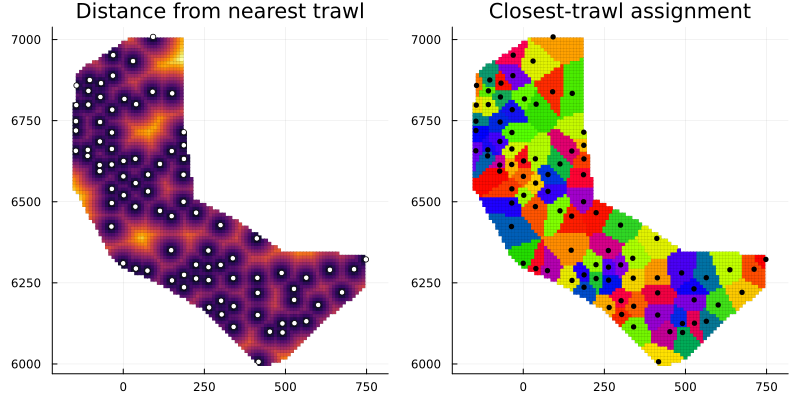

In [54]:
tree = KDTree(coordinates.(domain(geotrawl_means)))
idx, dists = knn(tree, coordinates.(surveydomain), nrow(trawl_means))
p1 = scatter(surveydomain, zcolor=minimum.(dists), markerstrokewidth=0, markershape=:square, markersize=2,
    title="Distance from nearest trawl")
scatter!(p1, domain(geotrawl_means), color=:white, markersize=3)
p2 = scatter(surveydomain, zcolor=getindex.(idx, argmin.(dists)), markerstrokewidth=0, markershape=:square, markersize=2, c=:prism,
    title="Closest-trawl assignment")
scatter!(p2, domain(geotrawl_means), markersize=3)
plot(p1, p2, size=(800, 400))

# ttree = KDTree(coordinates.(domain(geotrawl_means)))
# ii, dd = nn(ttree, coordinates.(domain(geonasc)))
# plot(surveydomain, zcolor=ii[edsu_idx], markerstrokewidth=0, markershape=:square, markersize=4, c=:prism,
#     title="Trawl assignment", size=(800, 800), xlabel="Easting (km)", ylabel="Northing (km)")
# scatter!(domain(geonasc), color=:white, markersize=2, markerstrokewidth=0)
# scatter!(domain(geotrawl_means))

These plots show the distance of every simulated pixel from the nearest trawl, as well as a color-coded map showing the actual hard assignments.

We'd like to do this in a probabilistic way, though. One approach is to assign each pixel to a random trawl, and then repeat the random assignment a number of times. A simple random shuffling won't be appropriate; we'd like pixels to be assigned to nearby trawls more often than far-away trawls. We can accomplish this by weighting the probability of assignment to each trawl by the inverse distance to that trawl, with an exponent $a$ used to adjust the effective range of this weighting.  I set $a$ such that an average pixel had about a 50% chance of being assigned to the nearest trawl at a range of about 20 km from that trawl. This was about half the typical distance between trawls, and also about the same as the variogram range for mean TS. While this method of setting $a$ and defining the range is maybe a bit ad-hoc, I haven't come up with anything better yet.

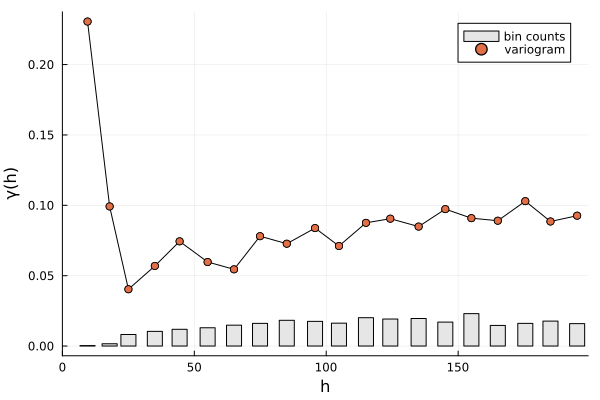

In [40]:
proportions = proportion_at_age(scaling)
proportions[!, :proportion] = [Array(row[2:end]) for row in eachrow(proportions)]
proportions = @select(proportions, :event_id, :proportion)

df = @chain trawl_means begin
    @select(:event_id, :x, :y)
    leftjoin(proportions, on=:event_id)
    georef((:x, :y))
end
vg_proportion = EmpiricalVariogram(df, :proportion, distance=TotalVariation(), algo=:full, maxlag=200)
plot(vg_proportion)


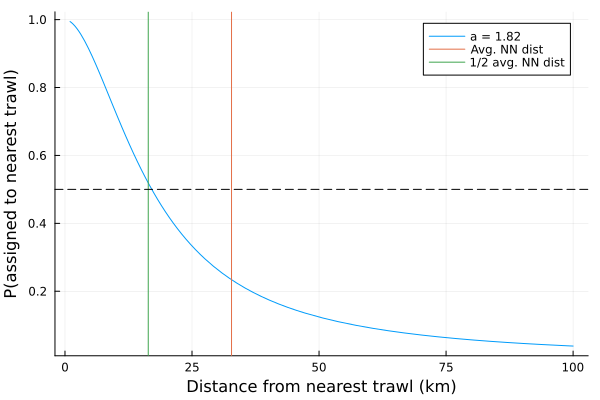

In [90]:
a = 1.82 # need to figure out way to fit this objectively
mean_nn_dist = mean(minimum.(dists))
mean_dist = mean(vcat([1 ./ sort(d)[2:end].^a  for d in dists]...))
plot(d -> 1 / (1 + d^a * (nrow(trawl_means)-1)*mean_dist), 1, 100, 
    label="a = $(a)", xlabel="Distance from nearest trawl (km)", ylabel="P(assigned to nearest trawl)")
vline!([mean_nn_dist mean_nn_dist/2], label=["Avg. NN dist"  "1/2 avg. NN dist"])
# vline!([range(trawl_tvgs[:ts_centered])], label="Mean-TS variogram range")
hline!([0.5], linestyle=:dash, color=:black, label="")

Defining some helper functions and then doing the random pixel assignment:

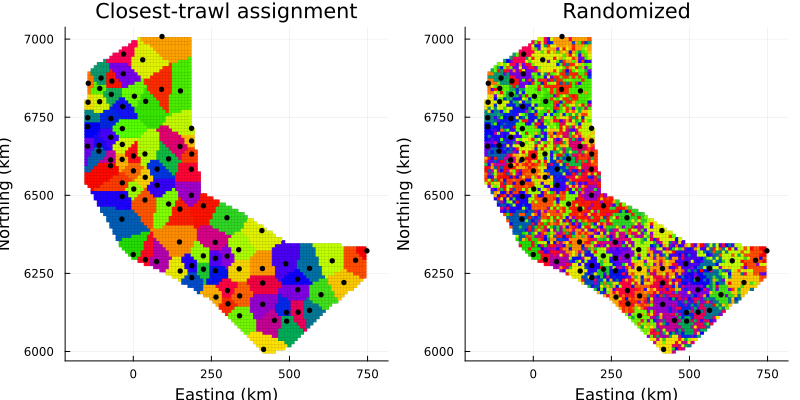

In [69]:
function trawl_assignments_rand!(assignments, kdtree, pixel_coords, trawl_coords)
    idx, dists = knn(kdtree, pixel_coords, length(trawl_coords))
    idx1 = [sample(i, Weights(1 ./ d.^a)) for (i, d) in zip(idx, dists)]
    assignments .= idx1
end
function trawl_assignments_rand!(assignments, pixel_coords, trawl_coords)
    kdtree = KDTree(trawl_coords)
    trawl_assignments_rand!(assignments, kdtree, pixel_coords, trawl_coords)
end
function trawl_assignments_rand(pixel_coords, trawl_coords)
    assignments = Vector{Int}(undef, length(pixel_coords))
    trawl_assignments_rand!(assignments, pixel_coords, trawl_coords)
    return assignments
end
    
trawl_assignment = trawl_assignments_rand(coordinates.(surveydomain), coordinates.(domain(geotrawl_means)))

p3 = scatter(surveydomain, zcolor=trawl_assignment, markerstrokewidth=0, markersize=2,
    marker=:square, c=:prism, title="Randomized");
scatter!(p3, domain(geotrawl_means),markersize=3)
plot(p2, p3, size=(800, 400), xlabel="Easting (km)", ylabel="Northing (km)")

In the plot above, we can see the result of one of these random-assignment draws. There are still zones of influence around the trawls, visible as the blobs of uniform color, but the edges, where pixels are roughly equidistant from two or more trawls, are blurred by the random reassignment.

An alternative way of randomizing this part of the processing pipeline is to randomly jitter the trawl locations and reassign the pixels to the nearest *jittered* trawl:

In [ ]:
function trawl_assignments_jittered!(assignments, pixel_coords, trawl_coords)
    trawl_locs_jittered = [x + 20randn(2) for x in trawl_coords]
    tree2 = KDTree(trawl_locs_jittered)
    idx2, dists2 = knn(tree2, pixel_coords, length(trawl_coords))
    assignments .= getindex.(idx2, argmin.(dists2))
end
function trawl_assignments_jittered(pixel_coords, trawl_coords)
    assignments = Vector{Int}(undef, length(pixel_coords))
    trawl_assignments_jittered!(assignments, pixel_coords, trawl_coords)
end

trawl_assignments2 = trawl_assignments_rand(coordinates.(surveydomain), coordinates.(domain(geotrawl_means)))

p3 = scatter(surveydomain, zcolor=trawl_assignments2, markerstrokewidth=0, markersize=2, c=:prism,
    title="Jittered trawls")
scatter!(p3, domain(geotrawl_means), markersize=3, color=:black)
plot(p2, p3)

The black points in each plot show the true trawl locations, but the region boundaries on the right reflect the nearest-neighbor assignment based on their locations plus a 20 km random jitter.

Before putting everything together, I define distributions for two other sources of error: the calibration uncertainty, which I set to 0.1 dB (debatable) and the proportion of water column NASC falling in the acoustic dead zone. To estimate that proportion

In [ ]:
cal_error = Normal(0, 0.1) # calibration uncertainty (dB)
# assuming density in the bottom 0.5 m is the same as in the 10 m interval above it:
deadzone_nasc = acoustics.bottom_nasc * (0.5 / 10)
pdeadzone = deadzone_nasc ./ (deadzone_nasc .+ acoustics.nasc)
pdeadzone = pdeadzone[isfinite.(pdeadzone)]
println(minimum(pdeadzone))
dist_deadzone = fit(Beta, pdeadzone)
histogram(pdeadzone, normalize=true, label="Est. from data", 
    xlabel="Proportion of NASC in dead zone", ylabel="Probability")
plot!(dist_deadzone, xlims=(0, 0.05), label="Fitted Beta distribution")

In [ ]:
event_ids = unique(trawl_means.event_id)
dropped_trawl = rand(event_ids)



Finally, putting all these steps together in a single loop of 500 bootstrap simulations. At every iteration, we simulate a NASC field conditional on the data, simulate a mean $\sigma_{bs}$ field conditional on the data, use those two variables to calculate a map of total numerical density, bootstrap all the trawl catches, and then divide up the total number of fish according to the bootstrapped proportions-at-age.

In [ ]:
nreplicates = 500

# trawl_probs = Dict((sym => SimulationProblem(geotrawl_means, surveydomain, sym => Float64, nreplicates) 
#     for sym in trawl_vars)...,)
# trawl_sols = Dict((sym => solve(trawl_probs[sym], LUGS(sym => (variogram=trawl_tvgs[sym],)))
#     for sym in trawl_vars)...,)

N_at_age = map(1:nreplicates) do i
    # Simulate NASC
    nasc = nonneg_lusim(params, zdists)
    nasc .*= exp10(rand(cal_error) / 10)
    nasc ./= (1 .- rand(dist_deadzone, length(nasc)))
    dropped_trawl = rand(event_ids)
    
    geotrawl_means_jack = georef(@subset(trawl_means, :event_id .!= dropped_trawl), (:x, :y))
    trawl_assignment = trawl_assignments_rand(coordinates.(surveydomain), coordinates.(domain(geotrawl_means_jack)))
    scaling_jack = @subset(scaling, :event_id .!= dropped_trawl)
    # Simulate mean TS and weight
    scaling_sim = resample_scaling(scaling_jack)
    scaling_sim[!, :sigma_bs] .*= exp10.(0.14 * randn(nrow(scaling_jack))/10)
    trawl_means_sim = get_trawl_means(scaling_sim)
    sigma_bs_sim = trawl_means_sim.sigma_bs[trawl_assignment]
    N_sim = nasc ./ (4π * sigma_bs_sim) * dA;
    
    p_at_age_sim = proportion_at_age(scaling_sim)
    

    N_at_age_sim = N_sim .* p_at_age_sim[trawl_assignment, 2:end]
    return sum.(eachcol(N_at_age_sim))
end;


Plotting those distributions of abundance at age:

In [ ]:
using ColorSchemes
density(hcat(N_at_age...)', palette=:Paired_10, 
    label = "Age " .* string.([1:10;]'), xlabel="Total abundance (#)", ylabel="Probability density",
    ylims=(0, 2e-8), size=(1000, 600), margin=10px)

Looking at these results another way, we can calculate the C.V. of abundance at each age: 

In [ ]:
DataFrame(
    Age = 1:AGE_MAX,
    CV_percent = round.(std(N_at_age) ./ mean(N_at_age) .* 100, digits=1)
)

These are in the range of 4% for the most abundant age groups (4-6 year olds), and range up to 24% for the 10+ fish.

In [ ]:
N_tot = sum.(N_at_age)
density(N_tot, label="", xlabel="Total abundance (#)", ylabel="Probability density")

The total variance seems to be dominated by the variance of the most abundant age classes, and is also in the 4% range.

In [ ]:
std(N_tot) / mean(N_tot) * 100